<a href="https://colab.research.google.com/github/kkiani/low-light-image-enhancement/blob/master/Low_Light_Image_Enhancement_with_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Introduction

In this project we are going to build a deep convolutional neural network model to improve low ligth images. 
<center><img src="https://www.soyacincau.com/wp-content/uploads/2014/04/140415-ASUS-PixelMaster.jpg"></center>
<br/><br/>

[Download dataset](https://www.kaggle.com/duttadebadri/image-classification)
> **About dataset:**
> 
> So I have a knack of photography and travelling. I wanted to create a model for myself which can classify my own pictures. But to be honest, a Data Scientist should always know how to collect data. So I scraped data from google images using a Python Script and using other open-source data sources from MIT, Kaggle itself, etc. Request everyone to give a try. I'll update the no. of images in validation set as time goes on.
> 
> The link to the scripting file is here:
> 
> https://github.com/debadridtt/Scraping-Google-Images-using-Python
> 
> The images belong typically to 4 classes:
> 
> * Art & Culture
> * Architecture
> * Food and Drinks
> * Travel and Adventure
> 


# 2. Getting dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import os
os.chdir('drive/My Drive/Kaggle/image-classification')

In [ ]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle

from google.colab import files
files.upload()

!cp kaggle.json ~/.kaggle/

!kaggle datasets download -d duttadebadri/image-classification
!unzip image-classification.zip

In [ ]:
%tensorflow_version 1.x

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import cv2 as cv
import matplotlib.pyplot as plt
from keras.preprocessing import image
from keras.applications.inception_resnet_v2 import InceptionResNetV2
from keras.applications.inception_resnet_v2 import preprocess_input,decode_predictions
from keras import backend as K
from keras.layers import add, Conv2D,MaxPooling2D,UpSampling2D,Input,BatchNormalization, RepeatVector, Reshape
from keras.layers.merge import concatenate
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from tensorflow import set_random_seed
set_random_seed(2)
np.random.seed(1)

Using TensorFlow backend.


# 3. Setup GPU

## 3.1. check if any gpu device is available

In [ ]:
from keras import backend as K
K.tensorflow_backend._get_available_gpus()

['/job:localhost/replica:0/task:0/device:GPU:0']

## 3.2. Config tensorflow to use GPU

In [ ]:
import keras
import tensorflow as tf

config = tf.ConfigProto( device_count = {'GPU': 1 , 'CPU': 56} ) 
sess = tf.Session(config=config) 
keras.backend.set_session(sess)

In [ ]:
InputPath="/content/drive/My Drive/Kaggle/image-classification/images/images/art and culture/"
khu_path = '/content/drive/My Drive/Kaggle/3174533.jpg'

# 4. Prepareing Dataset

In this step we are going to make 2 type of packages inorder to make a perfect low light image for training and testing our model:


*   Noise Maker Package
*   Image Light Changer Package



## 4.1. Noise Maker Package
here we create a class as a package to hold 4 types of noises
### 4.1.1 Gussian Noise
the values that the noise can take on are Gaussian-distributed

<center>
<img src="https://upload.wikimedia.org/wikipedia/commons/d/d2/512x512-Gaussian-Noise.jpg" width="200" height="200" />
<br/>
<img src="https://wikimedia.org/api/rest_v1/media/math/render/svg/56d469e7d13e0c93f944b159302ab28d1c306fcf" width="200" height="200" />
</center>

### 4.1.2. Salt and Peper Noise
Salt-and-pepper noise is a form of noise sometimes seen on images. It is also known as impulse noise. This noise can be caused by sharp and sudden disturbances in the image signal. It presents itself as sparsely occurring white and black pixels.

<center>
<img src="https://upload.wikimedia.org/wikipedia/commons/f/f4/Noise_salt_and_pepper.png" width="200" height="200" /></center>

### 4.1.3. Poisson Noise
Shot noise or Poisson noise is a type of noise which can be modeled by a Poisson process. In electronics shot noise originates from the discrete nature of electric charge. Shot noise also occurs in photon counting in optical devices, where shot noise is associated with the particle nature of light.

<center><img src="https://upload.wikimedia.org/wikipedia/commons/4/42/Photon-noise.jpg" width="200" height="200"/></center>


In [ ]:
class Noise:
  @staticmethod 
  def applyGussianTo(image: np.array):
    row,col,ch= image.shape
    mean = 0
    var = 0.0001
    sigma = var**0.05
    gauss = np.random.normal(mean,sigma,(row,col,ch))
    gauss = gauss.reshape(row,col,ch)
    noisy =  gauss + image
    return noisy

  @staticmethod
  def applySaltAndPeperTo(image: np.array, amount=1.0):
    row,col,ch = image.shape
    s_vs_p = 0.5
    out = np.copy(image)
    # Salt mode
    num_salt = np.ceil(image.size * s_vs_p) * amount
    coords = [np.random.randint(0, i, int(num_salt)) for i in image.shape]
    out[coords] = 1

    # Pepper mode
    num_pepper = np.ceil(image.size * (1. - s_vs_p)) * amount
    coords = [np.random.randint(0, i , int(num_pepper)) for i in image.shape]
    out[coords] = 0
    return out

  @staticmethod
  def applyPoissonTo(image: np.array):
    vals = len(np.unique(image))
    vals = 2 ** np.ceil(np.log2(vals))
    noisy = np.random.poisson(image * vals) / float(vals)
    return noisy

## 4.2. Image Light Changer Package

In [ ]:
class Light:
  @staticmethod
  def applyLowLightTo(image: np.array, intenMultp: float=0.2):
    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV) #convert it to hsv
    hsv[...,2] = hsv[...,2]*intenMultp
    return cv.cvtColor(hsv, cv.COLOR_HSV2BGR)

## 4.3. Test Noise and Light packages


### 4.3.1. Original image

255

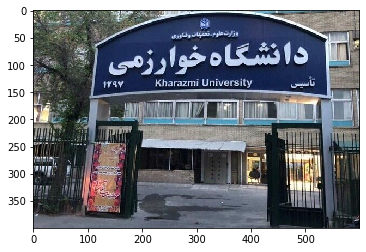

In [ ]:
img = cv.imread(khu_path)  
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
l = img.max()
plt.imshow(img)
l

### 4.3.2. Image with salt and peper noise




/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


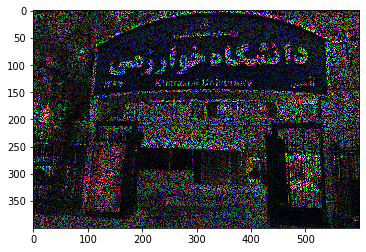

In [ ]:
noisyImage = Noise.applySaltAndPeperTo(img)
plt.imshow(noisyImage)

### 4.3.3. Image with low-brightness and salt-pepper noise

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


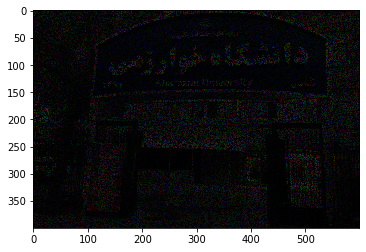

In [ ]:
lowLightImg = Light.applyLowLightTo(img)
noisyImage2 = Noise.applySaltAndPeperTo(lowLightImg)

plt.imshow(noisyImage2)

# 5. Classic Method

## 5.1. Median Filter
The Median Filter works fine with 10% salt and peper noises

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


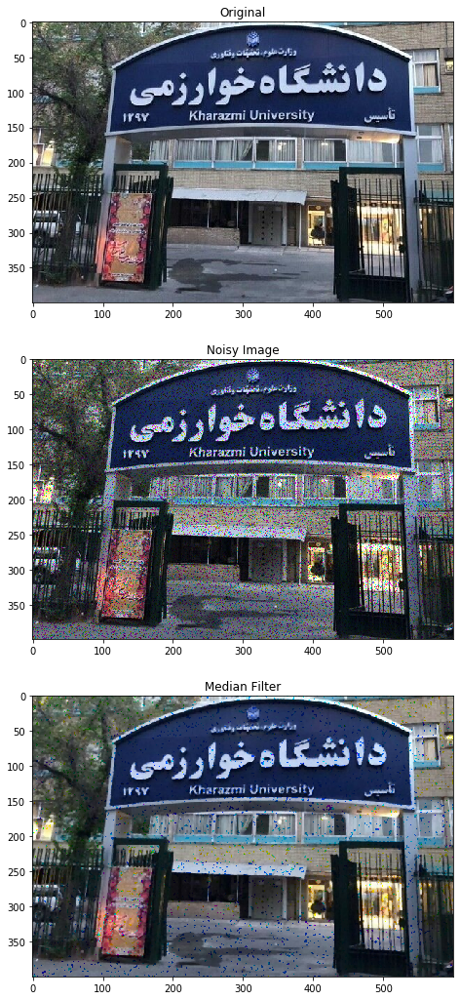

In [ ]:
image = cv.imread(khu_path)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
figure_size = 3

noisyImage = Noise.applySaltAndPeperTo(image, 0.1)

noisyImage = cv.cvtColor(noisyImage, cv.COLOR_RGB2HSV)
classic_new_image = cv.medianBlur(noisyImage, ksize=figure_size)

plt.figure(figsize=(10, 18))
plt.subplot(3, 1, 1)
plt.imshow(image)
plt.title('Original')

plt.subplot(3, 1, 2)
plt.imshow(cv.cvtColor(noisyImage, cv.COLOR_HSV2RGB))
plt.title('Noisy Image')

plt.subplot(3, 1, 3)
plt.imshow(cv.cvtColor(classic_new_image, cv.COLOR_HSV2RGB))
plt.title('Median Filter')

plt.show()

however, if we add more salt and peper noise, the median filter results will not good as we expected.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


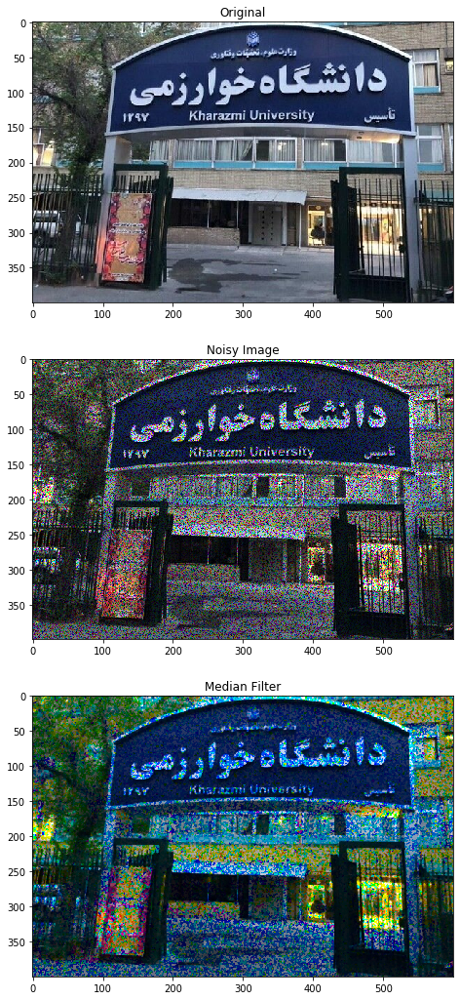

In [ ]:
image = cv.imread(khu_path)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
figure_size = 3

noisyImage = Noise.applySaltAndPeperTo(image, 0.3)

noisyImage = cv.cvtColor(noisyImage, cv.COLOR_RGB2HSV)
classic_new_image2 = cv.medianBlur(noisyImage, ksize=figure_size)

plt.figure(figsize=(10, 18))
plt.subplot(3, 1, 1)
plt.imshow(image)
plt.title('Original')

plt.subplot(3, 1, 2)
plt.imshow(cv.cvtColor(noisyImage, cv.COLOR_HSV2RGB))
plt.title('Noisy Image')

plt.subplot(3, 1, 3)
plt.imshow(cv.cvtColor(classic_new_image2, cv.COLOR_HSV2RGB))
plt.title('Median Filter')

plt.show()

## 5.2. Improve lights

In [ ]:
def adjust_gamma(image, gamma=1.0):
   invGamma = 1.0 / gamma
   table = np.array([((i / 255.0) ** invGamma) * 255
      for i in np.arange(0, 256)]).astype("uint8")

   return cv.LUT(image, table)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


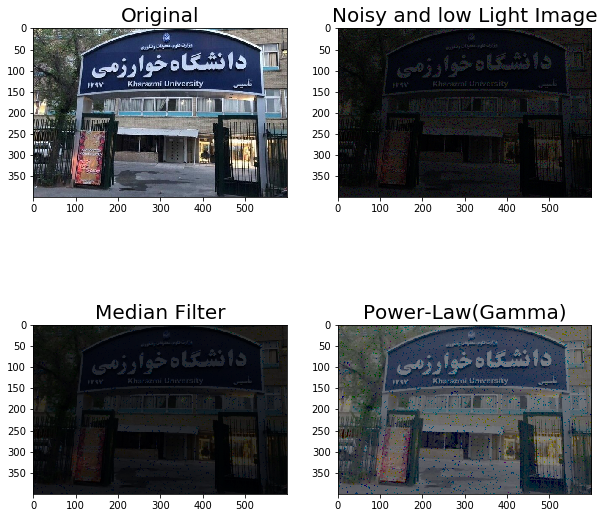

In [ ]:
image = cv.imread(khu_path)
image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
figure_size = 3

noisyImage = Noise.applySaltAndPeperTo(image, 0.1)
lowLightImg_c = Light.applyLowLightTo(noisyImage)
lowLightImg_c = cv.cvtColor(lowLightImg_c, cv.COLOR_RGB2HSV)

classic_new_image2 = cv.medianBlur(lowLightImg_c, ksize=figure_size)
classic_new_image2 = cv.cvtColor(classic_new_image2, cv.COLOR_HSV2RGB)

plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1)
plt.imshow(image)
plt.title('Original', fontsize=20)

plt.subplot(2, 2, 2)
plt.imshow(cv.cvtColor(lowLightImg_c, cv.COLOR_HSV2RGB))
plt.title('Noisy and low Light Image', fontsize=20)


plt.subplot(2, 2, 3)
plt.imshow(classic_new_image2)
plt.title('Median Filter', fontsize=20)

plt.subplot(2, 2, 4)
img_t = adjusted = adjust_gamma(classic_new_image2, gamma=2.5)
plt.imshow(img_t)
plt.title('Power-Law(Gamma)', fontsize=20)

plt.show()

# 6. Deep Learning Method

## 6.1. Preprocessing Data

In [ ]:
%%capture
from tqdm import tqdm_notebook as tqdm


In [ ]:
def PreProcessData(ImagePath):
    X_=[]
    y_=[]
    count=0
    for imageDir in os.listdir(ImagePath):
        if count<2131:
            try:
                print(count)

                count=count+1
                img = cv.imread(ImagePath + imageDir)
                img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
                img_y = cv.resize(img,(500,500))

                intensity = np.random.randint(200, 300)/1000.0

                lowLightImg_x = Light.applyLowLightTo(img_y, intensity)
                noisyImage_x = Noise.applySaltAndPeperTo(lowLightImg_x)


                X_.append(noisyImage_x)
                y_.append(img_y)
            except:
                pass
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_,y_

In [ ]:
X_,y_ = PreProcessData(InputPath)

## 6.2. Creating Model

In [ ]:
K.clear_session()
def InstantiateModel(in_):
    
    model_1 = Conv2D(16,(3,3), activation='relu',padding='same',strides=1)(in_)
    model_1 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_1)
    model_1 = Conv2D(64,(2,2), activation='relu',padding='same',strides=1)(model_1)
    
    model_2 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(in_)
    model_2 = Conv2D(64,(2,2), activation='relu',padding='same',strides=1)(model_2)
    
    model_2_0 = Conv2D(64,(2,2), activation='relu',padding='same',strides=1)(model_2)
    
    model_add = add([model_1,model_2,model_2_0])
    
    model_3 = Conv2D(64,(3,3), activation='relu',padding='same',strides=1)(model_add)
    model_3 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_3)
    model_3 = Conv2D(16,(2,2), activation='relu',padding='same',strides=1)(model_3)
    
    model_3_1 = Conv2D(32,(3,3), activation='relu',padding='same',strides=1)(model_add)
    model_3_1 = Conv2D(16,(2,2), activation='relu',padding='same',strides=1)(model_3_1)
    
    model_3_2 = Conv2D(16,(2,2), activation='relu',padding='same',strides=1)(model_add)
    
    model_add_2 = add([model_3_1,model_3_2,model_3])
    
    model_4 = Conv2D(16,(3,3), activation='relu',padding='same',strides=1)(model_add_2)
    model_4_1 = Conv2D(16,(3,3), activation='relu',padding='same',strides=1)(model_add)
    #Extension
    model_add_3 = add([model_4_1,model_add_2,model_4])
    
    model_5 = Conv2D(16,(3,3), activation='relu',padding='same',strides=1)(model_add_3)
    model_5 = Conv2D(16,(2,2), activation='relu',padding='same',strides=1)(model_add_3)
    
    model_5 = Conv2D(3,(3,3), activation='relu',padding='same',strides=1)(model_5)
    
    return model_5
    

In [ ]:
Input_Sample = Input(shape=(500, 500,3))
Output_ = InstantiateModel(Input_Sample)
Model_Enhancer = Model(inputs=Input_Sample, outputs=Output_)

In [ ]:
Model_Enhancer.compile(optimizer="adam", loss='mean_squared_error')
Model_Enhancer.summary()


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 500, 500, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 500, 500, 16) 448         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 500, 500, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 500, 500, 32) 4640        conv2d_1[0][0]                   
___________________________________________________________________________________________

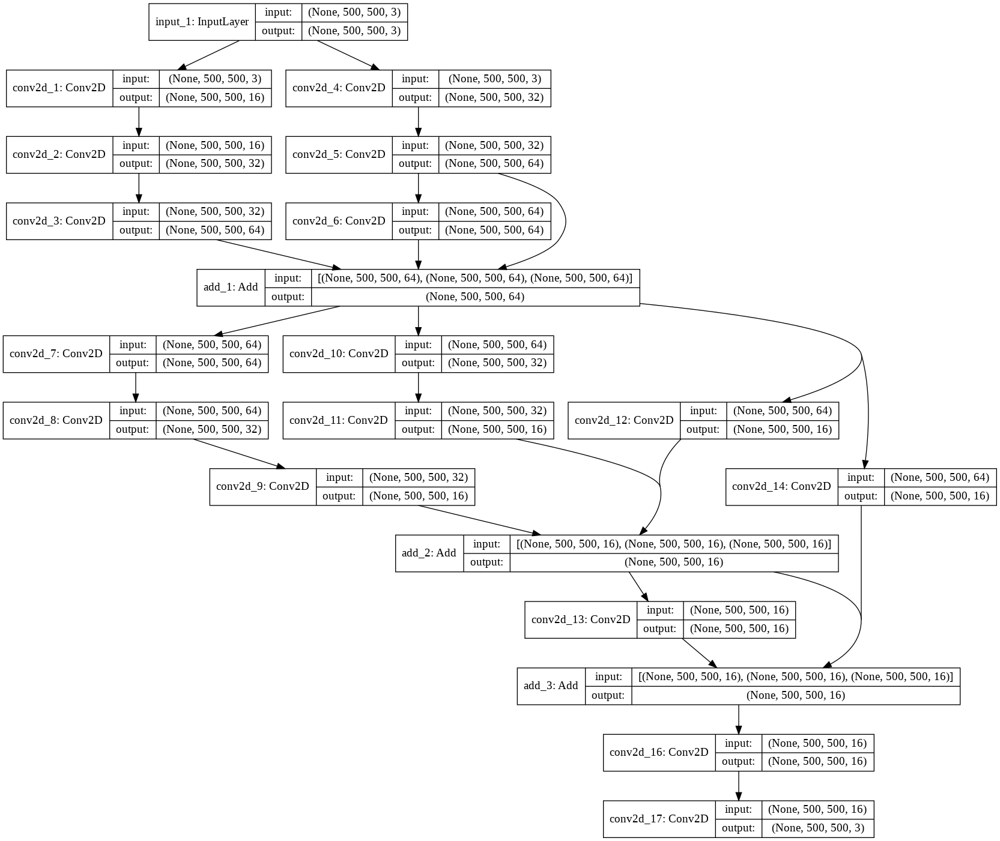

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(Model_Enhancer,to_file='model_.png',show_shapes=True, show_layer_names=True)
from IPython.display import Image
Image(retina=True, filename='model_.png')

## 6.3. Training

In [ ]:
def GenerateInputs(X,y):
    for i in range(len(X)):
        X_input = X[i].reshape(1,500,500,3)
        y_input = y[i].reshape(1,500,500,3)
        yield (X_input,y_input)
history = Model_Enhancer.fit_generator(GenerateInputs(X_,y_),epochs=53,verbose=1,steps_per_epoch=39,shuffle=True)



Epoch 1/53


39/39 [==============================] - 20s 520ms/step - loss: 10639.8995
Epoch 2/53
39/39 [==============================] - 4s 109ms/step - loss: 3353.7627
Epoch 3/53
39/39 [==============================] - 4s 109ms/step - loss: 1928.2732
Epoch 4/53
39/39 [==============================] - 4s 110ms/step - loss: 1260.8150
Epoch 5/53
39/39 [==============================] - 4s 110ms/step - loss: 1284.6548
Epoch 6/53
39/39 [==============================] - 4s 110ms/step - loss: 1302.9299
Epoch 7/53
39/39 [==============================] - 4s 111ms/step - loss: 1671.1201
Epoch 8/53
39/39 [==============================] - 4s 111ms/step - loss: 1668.8003
Epoch 9/53
39/39 [==============================] - 4s 111ms/step - loss: 1979.3890
Epoch 10/53
39/39 [==============================] - 4s 111ms/step - loss: 1170.2110
Epoch 11/53
39/39 [==============================] - 4s 112ms/step - loss: 955.3009
Epoch 12/53
39/39 [==============================] - 4s 112ms/step - 

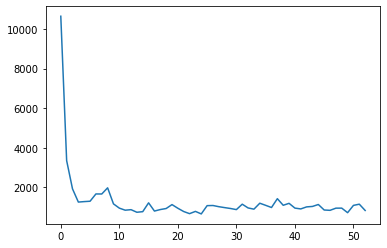

In [ ]:
plt.plot(history.history['loss'])
plt.show()

## 6.4. Testing results

In [ ]:
dataset1_Path="/content/drive/My Drive/Kaggle/image-classification/images/images/art and culture/"

In [ ]:
dataset2_Path="/content/drive/My Drive/Kaggle/image-classification/validation/validation/travel and adventure/"

In [ ]:
img_ = np.arange(500*500*3)
img_ = img_.reshape(500,500,3)
def testImage(path: str):
  plt.figure(figsize=(10,10))
  plt.subplot(2,2,1)
  img_1 = cv.imread(path)
  img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
  img_1 = cv.resize(img_1, (500, 500))
  img_1.shape
  plt.title("Original Image",fontsize=20)
  plt.imshow(img_1)

  plt.subplot(2,2,2)
  noisyImage = Noise.applySaltAndPeperTo(img_1)
  plt.title("Salt and Peper Noise", fontsize=20)
  plt.imshow(noisyImage)

  plt.subplot(2,2,3)
  lowLightImage = Light.applyLowLightTo(noisyImage)
  plt.title("Low Light Image",fontsize=20)
  plt.imshow(lowLightImage)

  plt.subplot(2,2,4)
  Prediction = Model_Enhancer.predict(lowLightImage.reshape(1, 500, 500, 3))
  Prediction = Prediction.reshape(500,500,3)
  img_[:,:,:] = Prediction[:,:,:]
  plt.title("Enhanced Image",fontsize=20)
  plt.imshow(img_)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


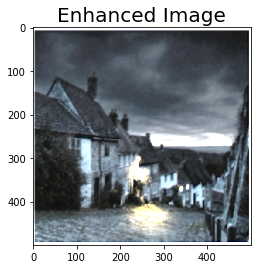

In [ ]:
path = '/content/drive/My Drive/Kaggle/day-to-night-7-27-min.jpg'
img_1 = cv.imread(path)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))

Prediction = Model_Enhancer.predict(img_1.reshape(1, 500, 500, 3))
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


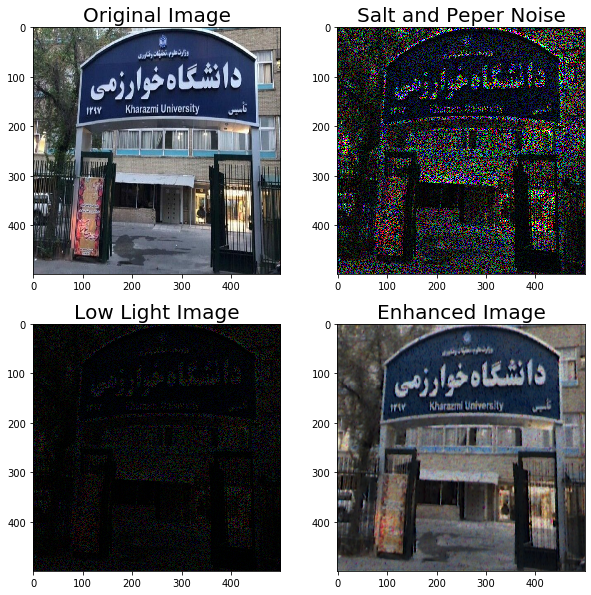

In [ ]:
testImage(khu_path)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


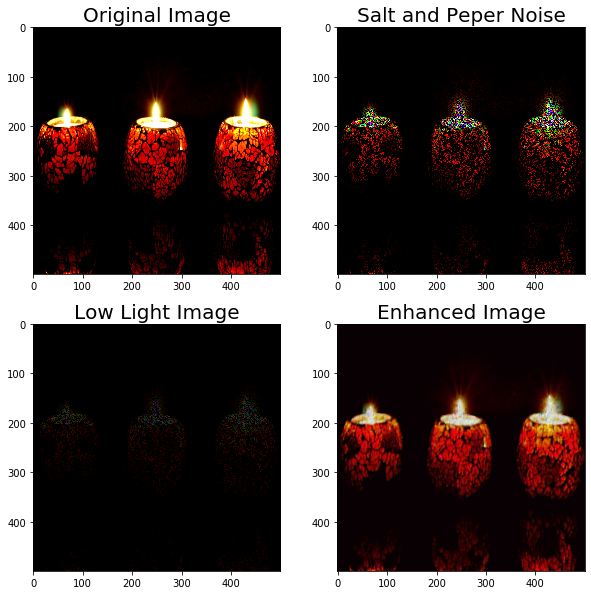

In [ ]:
testImage(dataset1_Path+"101 (6).jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


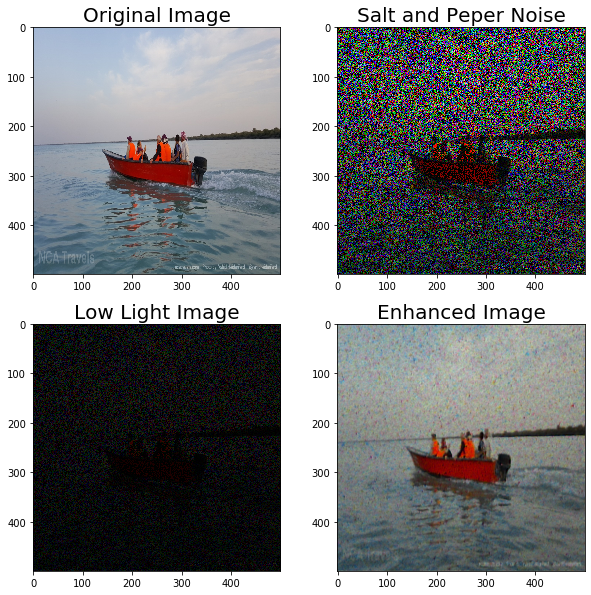

In [ ]:
testImage(dataset2_Path+"0.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


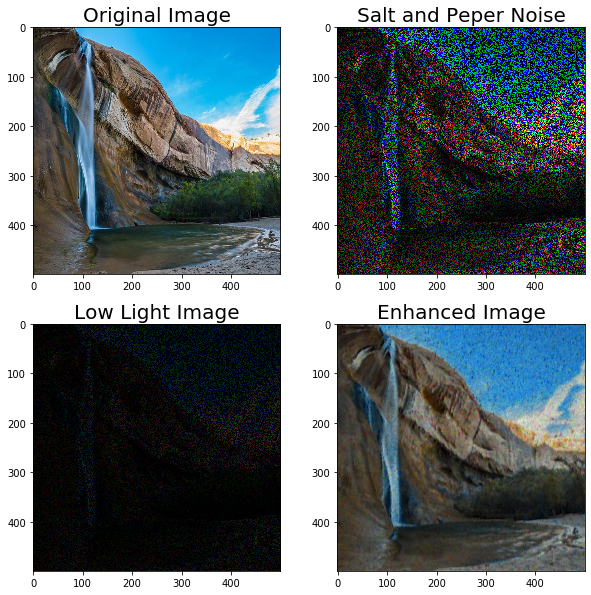

In [ ]:
testImage(dataset2_Path+"13.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


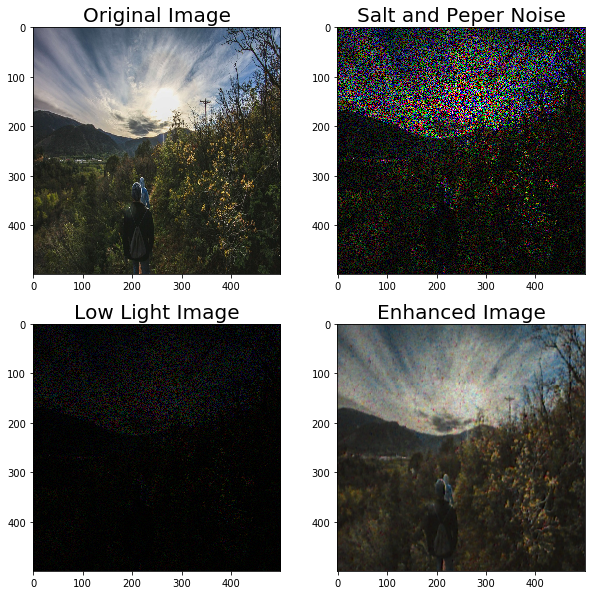

In [ ]:
testImage(dataset2_Path+"18.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


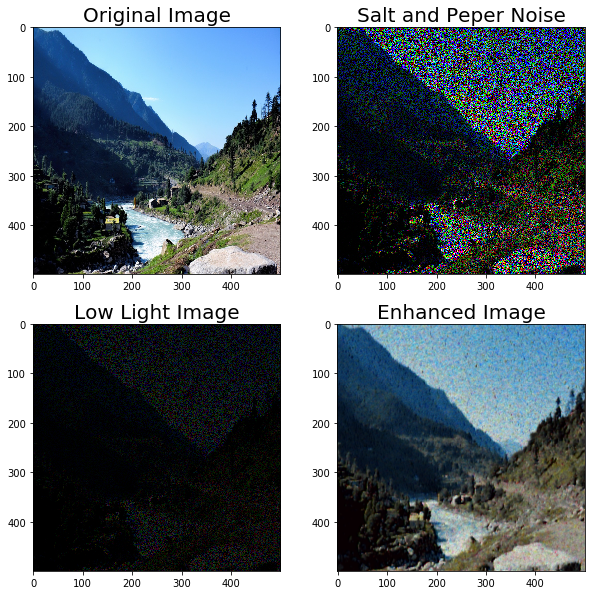

In [ ]:
testImage(dataset2_Path+"2.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


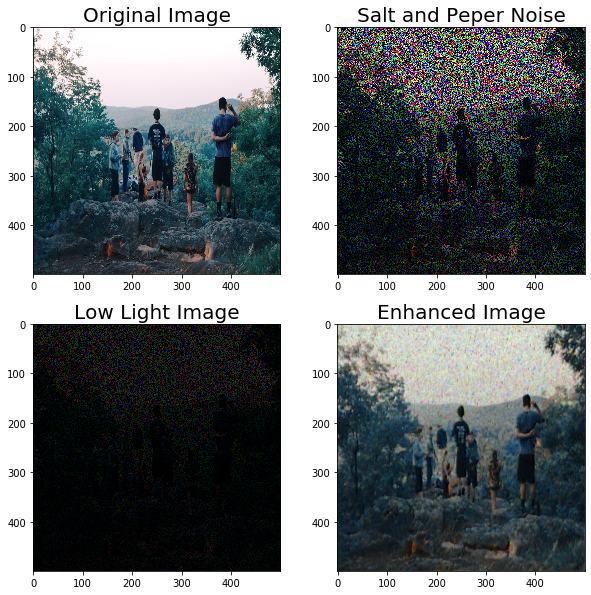

In [ ]:
testImage(dataset2_Path+"14.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


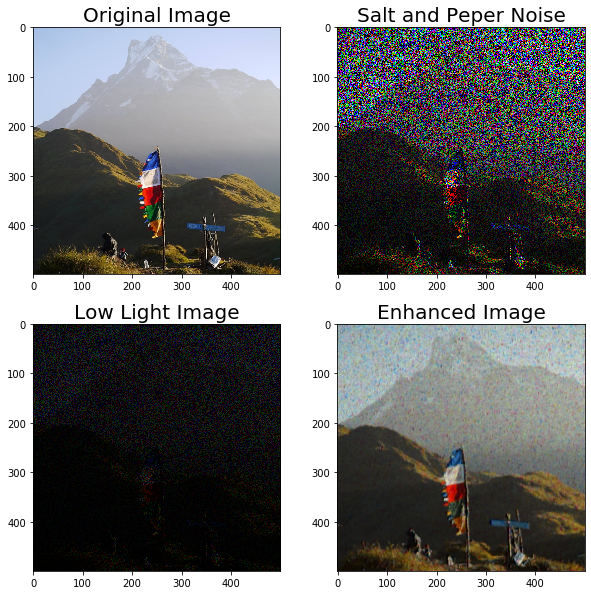

In [ ]:
testImage(dataset2_Path+"11.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


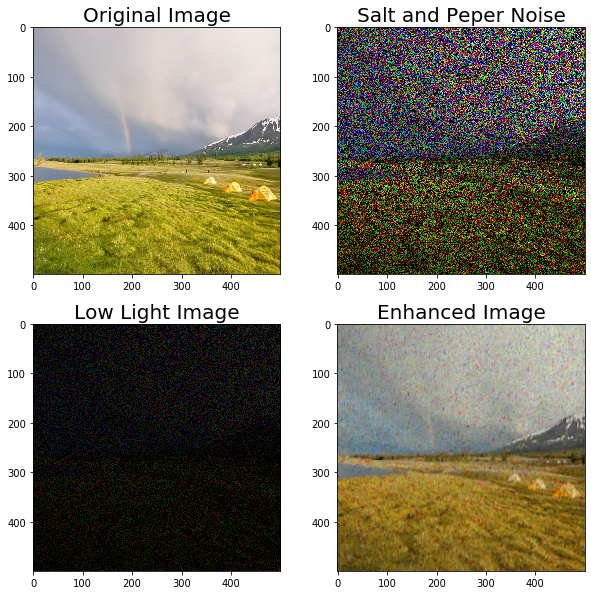

In [ ]:
testImage(dataset2_Path+"10.jpg")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:26: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


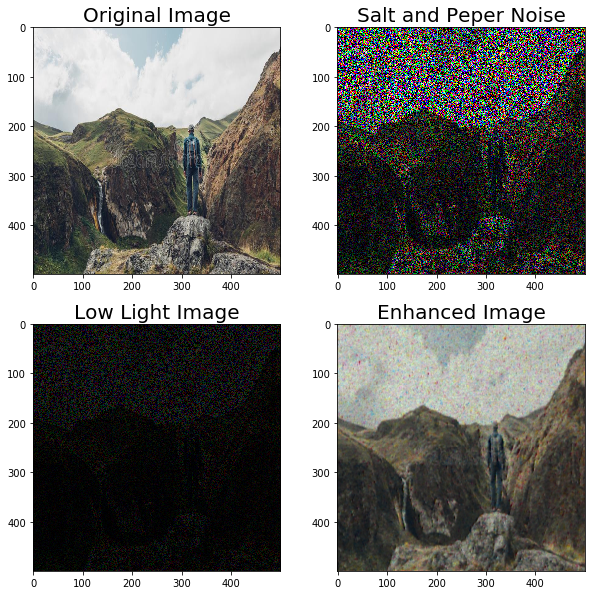

In [ ]:
testImage(dataset2_Path+"12.jpg")